In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os
from tqdm import tqdm
import pandas as pd


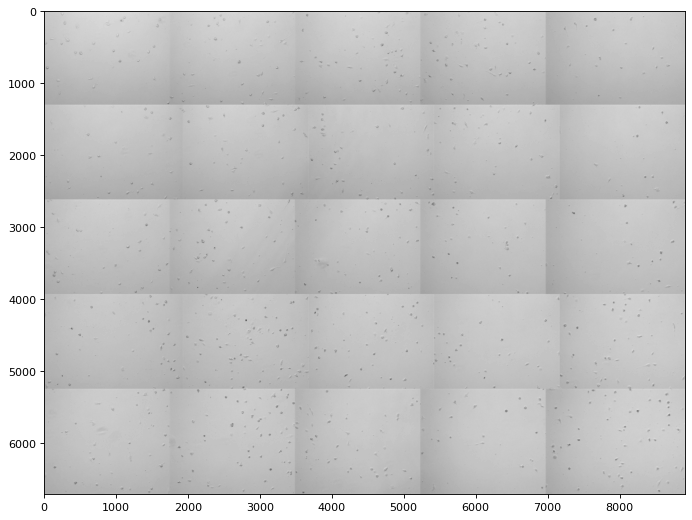

In [2]:
image_path = 'data/tif/0001.tif'

# These tif's are multilayer -- a small, but very significant distinction. 
# Load them with imreadmulti, rather than imread.
layers = []
_, layers = cv2.imreadmulti(mats=layers, filename=image_path, flags=cv2.IMREAD_UNCHANGED)
image = layers[1]
if image is None:
    print('Could not open or find the image')
    
def plot(image, res=(24,8)):
    plt.figure(figsize=res, dpi=80)
    plt.imshow(image, cmap="gray")
    plt.show()
    
plot(image)

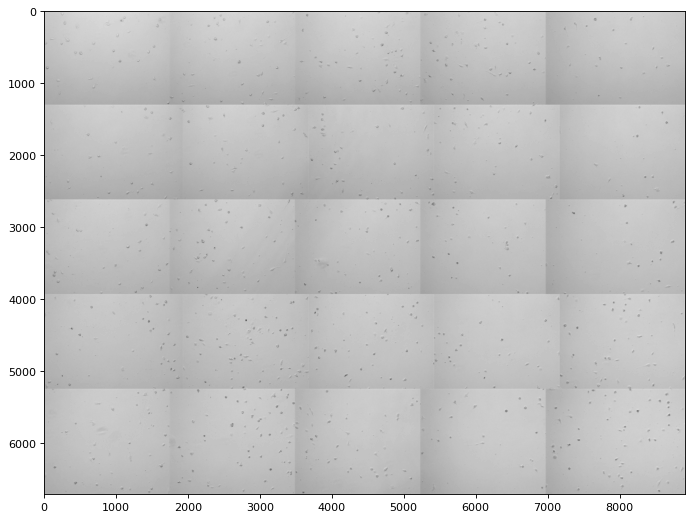

In [3]:
# Normalize image to between 0 and 255
normalized_image = cv2.normalize(image, None, alpha=0, beta=255, norm_type=cv2.NORM_MINMAX, dtype=cv2.CV_8UC1)
plot(normalized_image)

In [4]:
print(normalized_image)

def save(name, image, overwrite = False):
    if not os.path.exists(name) or overwrite:
        plt.imsave(name, image, cmap='gray')
    
save('test.png', normalized_image)

[[218 207 203 ... 216 211 210]
 [210 212 208 ... 216 208 211]
 [215 206 216 ... 210 210 197]
 ...
 [167 172 173 ... 188 199 199]
 [180 181 180 ... 187 209 207]
 [179 178 171 ... 186 194 190]]


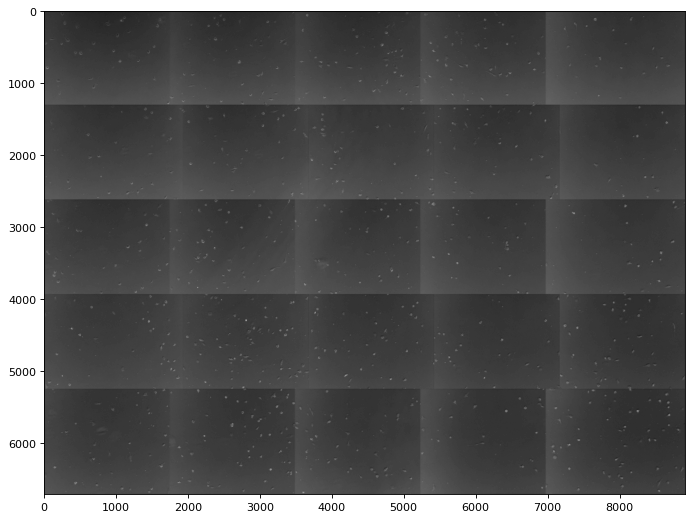

In [5]:
# Invert the image so the background corresponds to lower values
inv_image =  -1 * normalized_image + 255
inv_image = inv_image.astype('uint8')
plot(inv_image)

In [6]:
save('inv_test.png', inv_image)

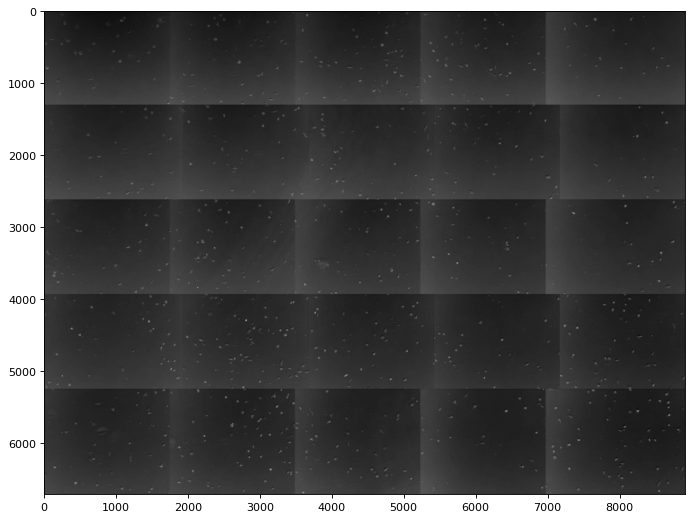

In [7]:
# Denoising the image
denoised_image = cv2.bilateralFilter(inv_image, 9, 95, 95)
plot(denoised_image)

In [8]:
save('denoised_test.png', denoised_image)

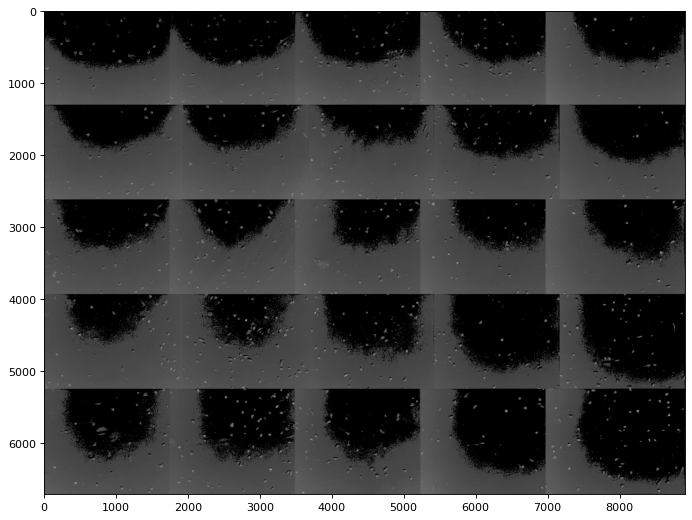

In [9]:
# Simple thresholding takes a pixel and sets 
# it to some other value if it is above of below 
# a given threshold.
_, simple_threshold = cv2.threshold(denoised_image, 60, 255, cv2.THRESH_TOZERO);
plot(simple_threshold)

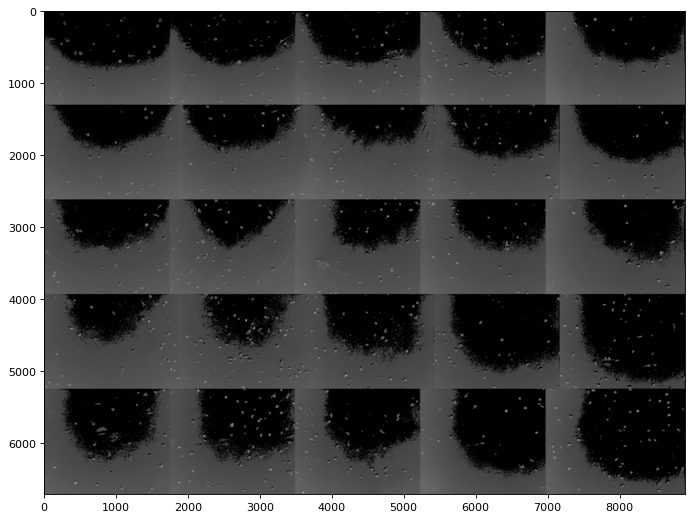

In [10]:
# We can threshold from above as well.
_, simple_threshold = cv2.threshold(simple_threshold, 230, 255, cv2.THRESH_TOZERO_INV);
plot(simple_threshold)

In [11]:
save('simple_threshold_test.png', simple_threshold)

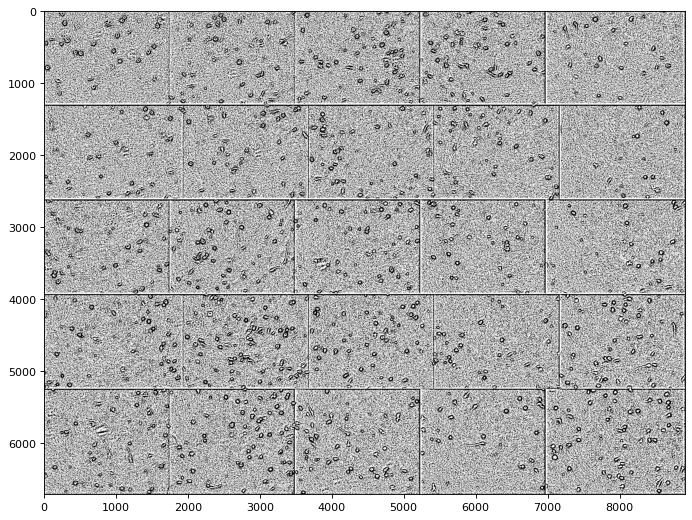

In [12]:
# Unfortunately, different parts of the image have different lighting, 
# so simple thresholding fails to apply evenly. Adaptive thresholding 
# can deal with this but changing the threshold to suit the lighting.
# This has the drawback of lacking nuance, setting every pixel to 
# 'off' or 'on'.
threshold_image = cv2.adaptiveThreshold(denoised_image,1,cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY,61,1)
plot(threshold_image)

In [13]:
save('threshold_test.png', threshold_image)

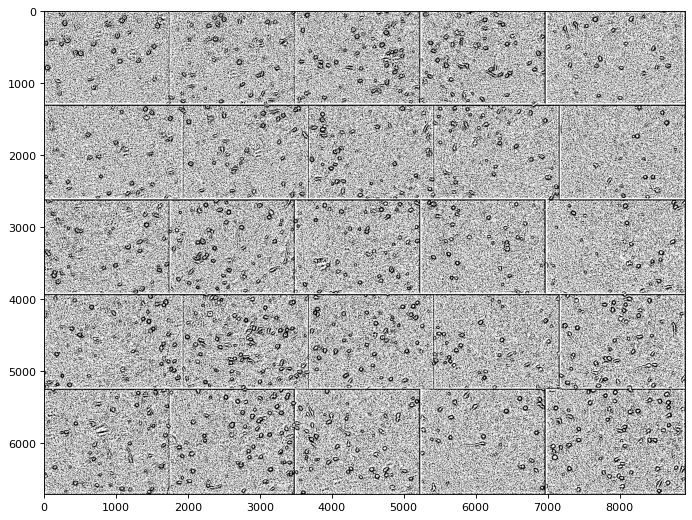

In [14]:
# Threshold does a good job of evening out the lighting, 
# but the resulting image is jagged and quite noisy. 
# Here we'll try to smooth it out.

smoothed_image = cv2.GaussianBlur(threshold_image, (5,5), 0)
plot(smoothed_image)

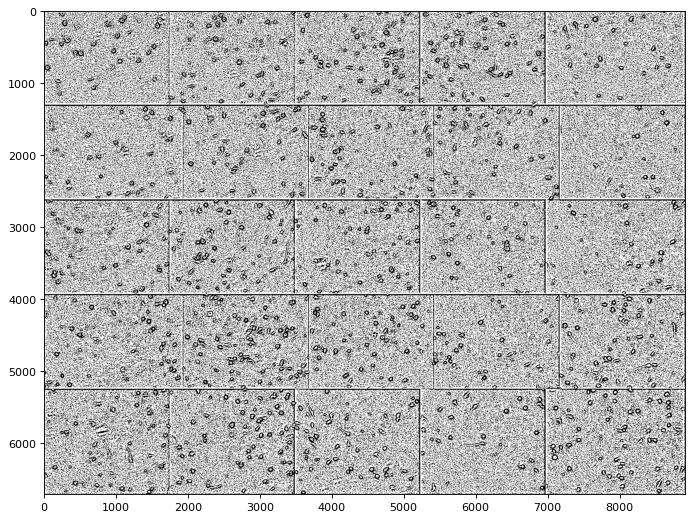

In [15]:
# Not quite what I wanted... Median blur maybe?
smoothed_image = cv2.medianBlur(threshold_image, 5)
plot(smoothed_image)

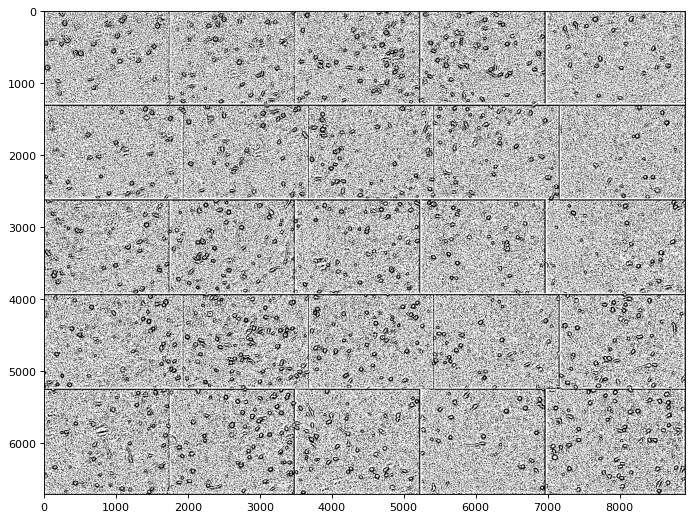

In [16]:
# What about uniform blur?
smoothed_image = cv2.blur(threshold_image, (5,5))
plot(smoothed_image)

In [17]:
save('smoothed_test.png', smoothed_image)

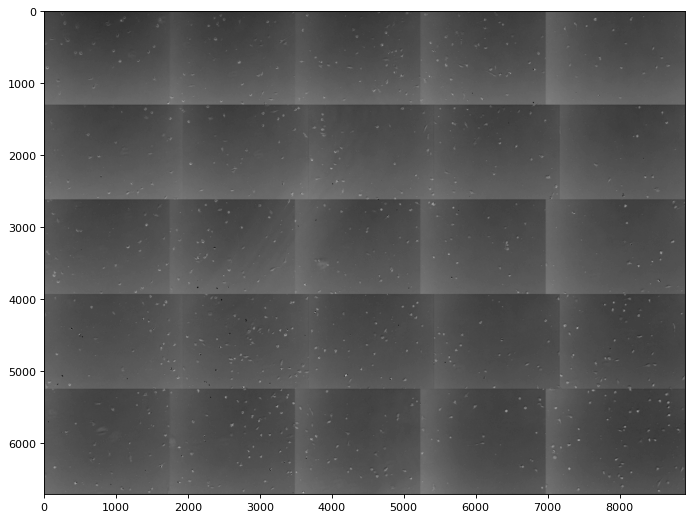

In [18]:
# Also not what I wanted. Lets see if we can't detect the boundaries of the stiched together image...
corners = cv2.cornerHarris(np.float32(denoised_image), 7, 5, 0.04)
corners = cv2.dilate(corners, None)
corner_image = denoised_image.copy()
corner_image[corners > 0.01*corners.max()] = 0
plot(corner_image)

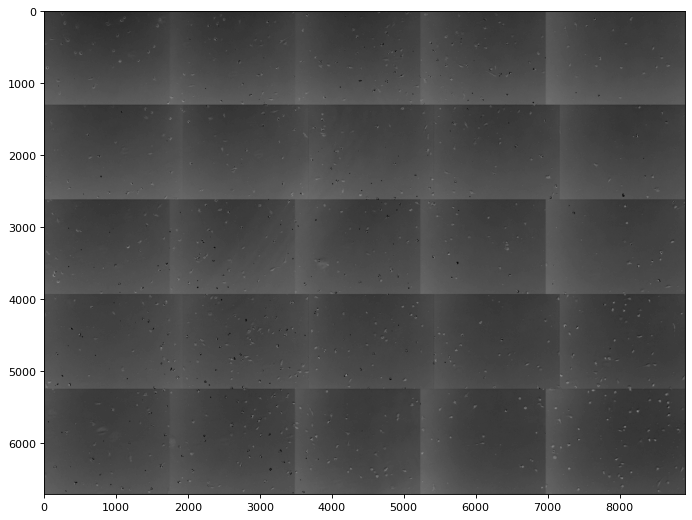

In [19]:
# Maybe denoising has a negative effect on edge detection. Let's try the image before denoising.
corners = cv2.cornerHarris(np.float32(inv_image), 7, 5, 0.04)
corners = cv2.dilate(corners, None)
corner_image = inv_image.copy()
corner_image[corners > 0.01*corners.max()] = 0
plot(corner_image)

In [20]:
save('corner_test.png', corner_image)

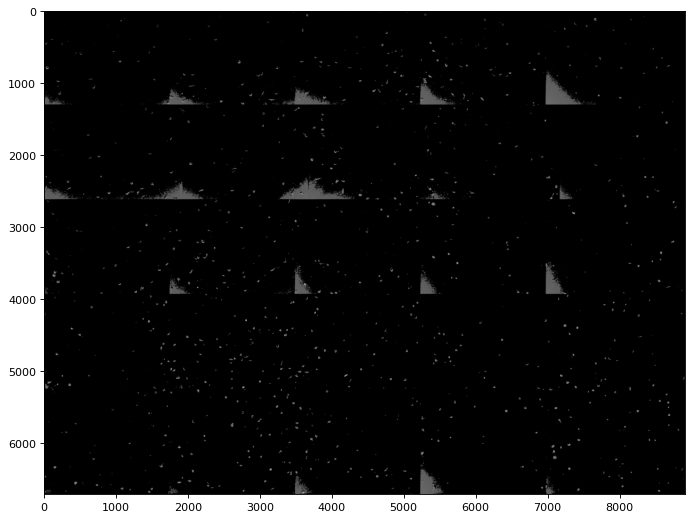

In [21]:
# Not any better it seems. 
# How about we try detecting lines rather 
# than points? I imagine the cells won't 
# fool something looking for straight lines 
# as easily. We'll follow 
# https://stackoverflow.com/questions/16665742/a-good-approach-for-detecting-lines-in-an-image

_, process = cv2.threshold(denoised_image, 85, 255, cv2.THRESH_TOZERO);
plot(process)

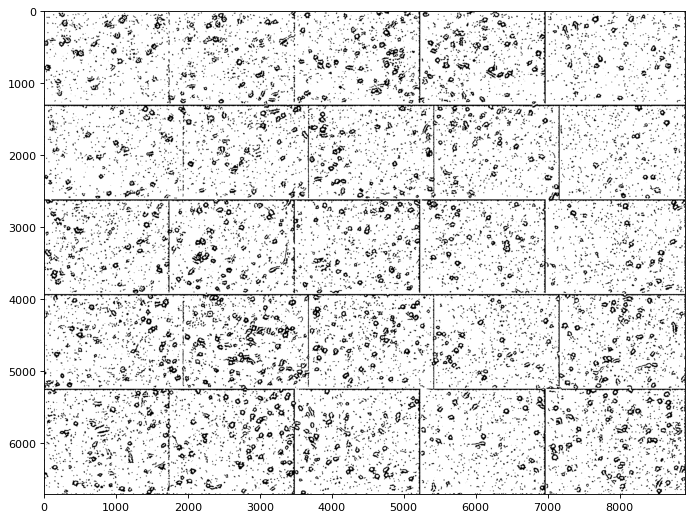

In [22]:
# Thresh to zero just doesn't work against the different lighting conditions.
# Let proceed with adaptive thresholding. Next step is to blur.
blur_iterations = 50
kernel = (5,5)
process = cv2.blur(threshold_image, kernel)
for _ in range(blur_iterations-1):
    process = cv2.blur(process, kernel)
plot(process)

In [23]:
# Next we'll make the skeleton representation.
def skeleton(img):
    size = np.size(img)
    skel = np.zeros(img.shape,np.uint8)
 
    ret,img = cv2.threshold(img,127,255,0)
    element = cv2.getStructuringElement(cv2.MORPH_CROSS,(3,3))
    done = False
 
    while not done:
        eroded = cv2.erode(img,element)
        temp = cv2.dilate(eroded,element)
        temp = cv2.subtract(img,temp)
        skel = cv2.bitwise_or(skel,temp)
        img = eroded.copy()
 
        zeros = size - cv2.countNonZero(img)
        if zeros==size:
            done = True

    return skel


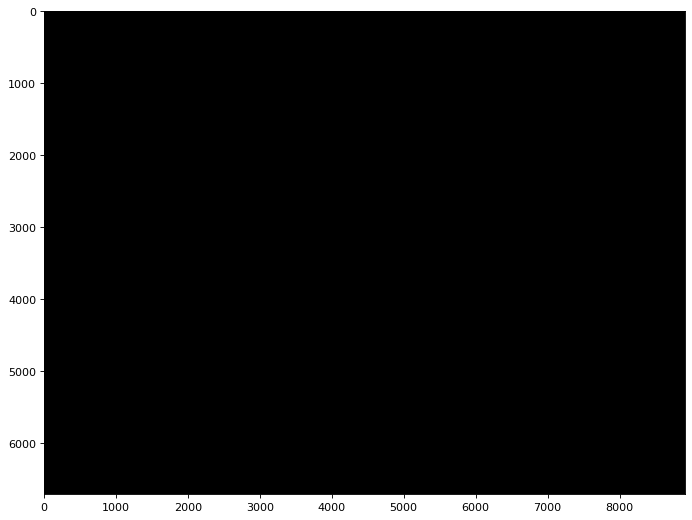

In [24]:
skeleton_image = skeleton(process)
plot(skeleton_image)

In [25]:
save('skel_test.png', skeleton_image)

In [26]:
# Pretty sure that's not supposed to be empty.
# Just to be sure, lets go through the final step.

def lines(src):
    # Directly from https://docs.opencv.org/3.4/d9/db0/tutorial_hough_lines.html
    dst = cv2.Canny(src, 50, 200, None, 3)
    
    # Copy edges to the images that will display the results in BGR
    cdst = cv2.cvtColor(dst, cv2.COLOR_GRAY2BGR)
    cdstP = np.copy(cdst)
    
    lines = cv2.HoughLines(dst, 1, np.pi / 180, 150, None, 0, 0)
    
    if lines is not None:
        for i in range(0, len(lines)):
            rho = lines[i][0][0]
            theta = lines[i][0][1]
            a = math.cos(theta)
            b = math.sin(theta)
            x0 = a * rho
            y0 = b * rho
            pt1 = (int(x0 + 1000*(-b)), int(y0 + 1000*(a)))
            pt2 = (int(x0 - 1000*(-b)), int(y0 - 1000*(a)))
            cv2.line(cdst, pt1, pt2, (0,0,255), 3, cv2.LINE_AA)
    
    
    linesP = cv2.HoughLinesP(dst, 1, np.pi / 180, 50, None, 50, 10)

    if linesP is not None:
        for i in range(0, len(linesP)):
            l = linesP[i][0]
            cv2.line(cdstP, (l[0], l[1]), (l[2], l[3]), (0,0,255), 3, cv2.LINE_AA)
            
    return (cdst, cdstP)
    

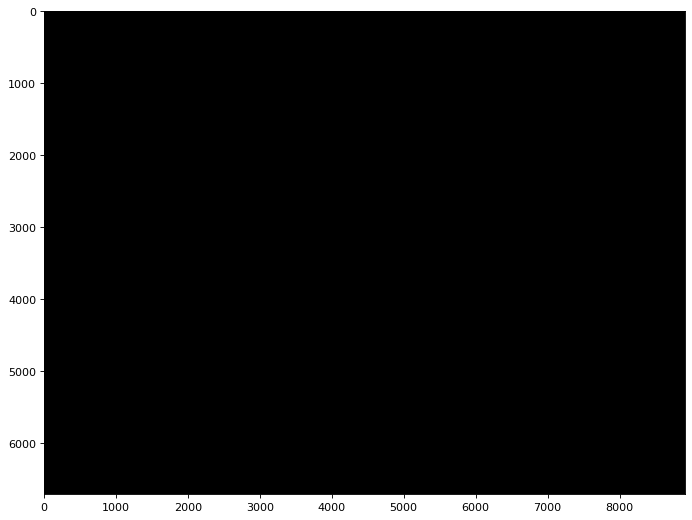

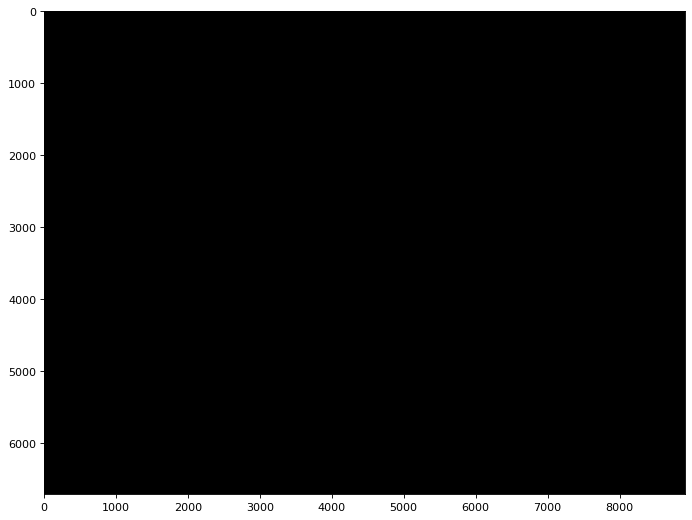

In [27]:
cdst, cdstP = lines(skeleton_image)
plot(cdst)
plot(cdstP)

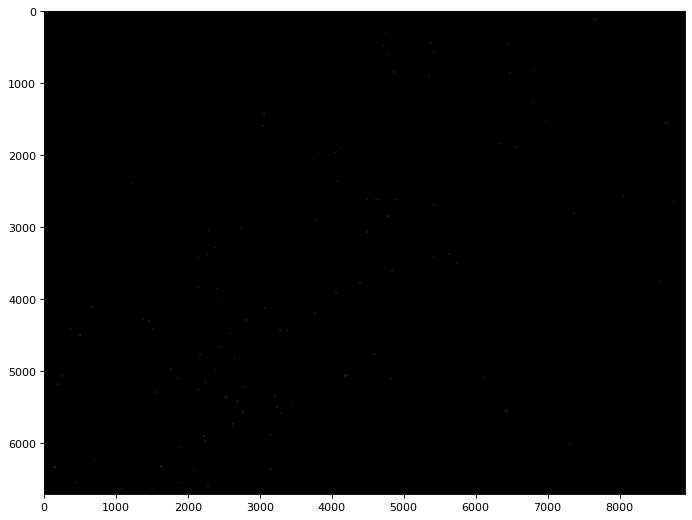

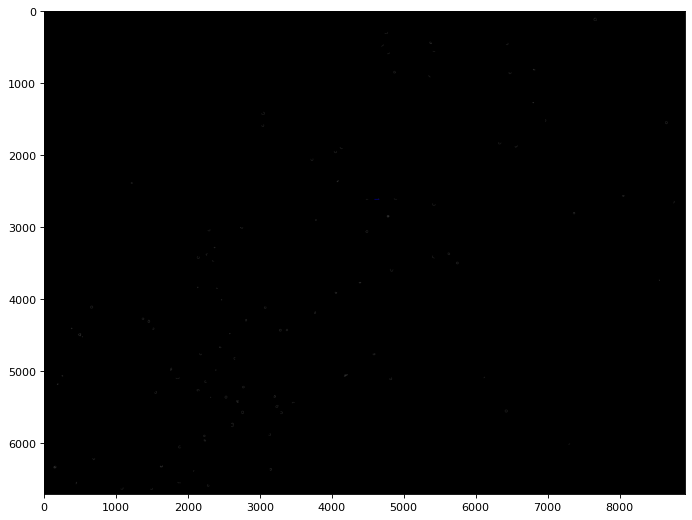

In [28]:
# Nothing. Alright, and what about before all the processing?
cdst, cdstP = lines(denoised_image)
plot(cdst)
plot(cdstP)

In [29]:
# There is something there, but it is not the borders like we wanted.
# Looking at the images again, they seem to mostly have the same boundaries.
# We'll just separate them out manually.

def split_25(image):
    subimages=[]
    # X's shift foward and backward, ys are constant across rows
    r1x=(0,1742,3485,5227,6969,image.shape[1])
    r2x=(0,1936,3678,5431,7162,image.shape[1])
    ys=(0,1314,2628,3942,5256,image.shape[0])
    
    #Calculate the appropriate splitting points
    vertices = []
    for shift, y in enumerate(ys):
        if shift == 0:
            continue
        if shift % 2 == 1:
            for index, x in enumerate(r1x):
                if index == 0:
                    continue
                vertex_pair = (r1x[index-1],ys[shift-1]),(x,y)
                vertices.append(vertex_pair)
        if shift % 2 == 0:
            for index, x in enumerate(r2x):
                if index == 0:
                    continue
                vertex_pair = (r2x[index-1],ys[shift-1]),(x,y)
                vertices.append(vertex_pair)
                
    # Crop the image according to the split points
    for ((x1,y1), (x2,y2)) in vertices:
        subimages.append(image[y1:y2, x1:x2])
    return subimages

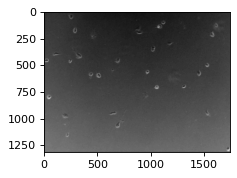

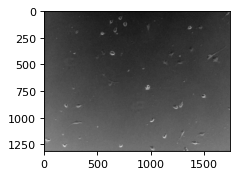

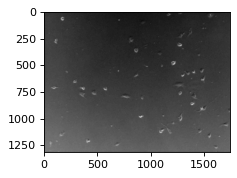

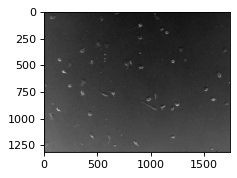

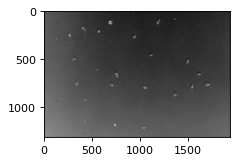

...

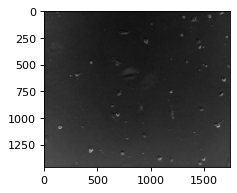

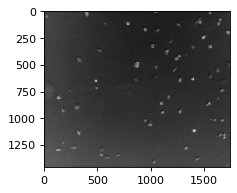

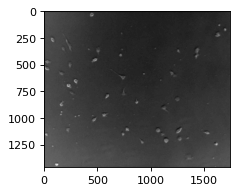

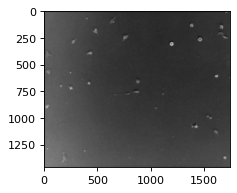

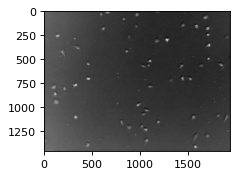

In [30]:
split_images = split_25(denoised_image)
for image in split_images:
    plot(image, res=(3,3))

In [31]:
# Later images (0040 and onward) are three by three
def split_9(image):
    subimages=[]
    
    r1x=(0,1742,3485,image.shape[1])
    r2x=(0,1936,3678,image.shape[1])
    ys=(0,1314,2628,image.shape[0])
    
    #Calculate the appropriate splitting points
    vertices = []
    for shift, y in enumerate(ys):
        if shift == 0:
            continue
        if shift % 2 == 1:
            for index, x in enumerate(r1x):
                if index == 0:
                    continue
                vertex_pair = (r1x[index-1],ys[shift-1]),(x,y)
                vertices.append(vertex_pair)
        if shift % 2 == 0:
            for index, x in enumerate(r2x):
                if index == 0:
                    continue
                vertex_pair = (r2x[index-1],ys[shift-1]),(x,y)
                vertices.append(vertex_pair)
                
    # Crop the image according to the split points
    for ((x1,y1), (x2,y2)) in vertices:
        subimages.append(image[y1:y2, x1:x2])
    return subimages

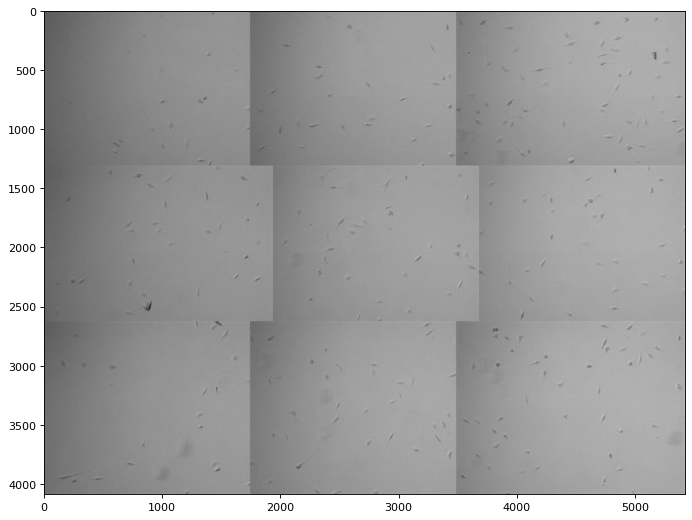

In [32]:
_, nine_image = cv2.imreadmulti(mats=layers, filename='data/tif/0044.tif', flags=cv2.IMREAD_UNCHANGED)
nine_image = nine_image[-1]
plot(nine_image)

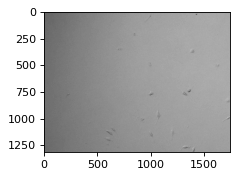

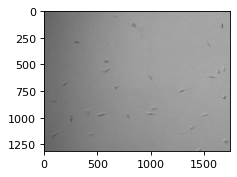

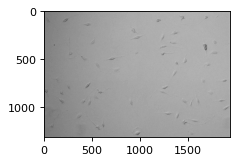

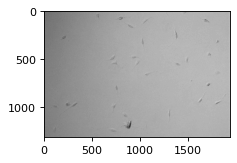

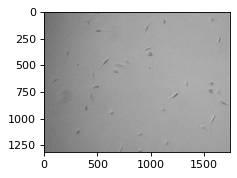

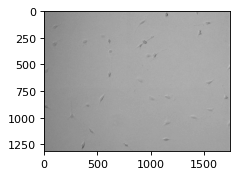

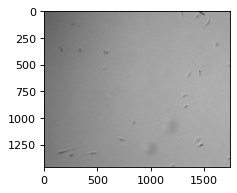

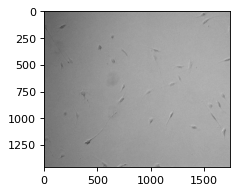

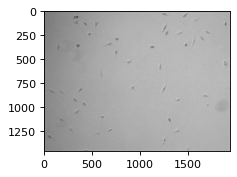

In [33]:
split_nine = split_9(nine_image)
for image in split_nine:
    plot(image, res=(3,3))

In [34]:
# With the means to split the images, we'll go ahead an perform the split on all images
# We'll convert them to png's too

tifs = [f for f in os.listdir('data/tif') if f[-4:]=='.tif']
global_index = 0
for tif in tqdm(tifs, total=len(tifs), ncols=80):
    layers = []
    _, layers = cv2.imreadmulti(mats=layers, filename='data/tif/'+tif, flags=cv2.IMREAD_UNCHANGED)
    image = layers[-1]
    normalized_image = cv2.normalize(image, None, alpha=0, beta=255, norm_type=cv2.NORM_MINMAX, dtype=cv2.CV_8UC1)
    split_images = split_25(normalized_image) if int(tif[:-4]) < 40 else split_9(image)
    for image in split_images:
        global_index += 1
        path = 'data/split/' + "{:04d}".format(global_index) + '.png'
        save(path, image)
        

100%|█████████████████████████████████████████| 133/133 [02:27<00:00,  1.11s/it]


In [35]:
# We'll have to do similarly for the xml data
import xml.etree.ElementTree as ET

tree = ET.parse('data/xml/0001.xml')
root = tree.getroot()
root.tag

'CellCounter_Marker_File'

In [36]:
# Collect all markers into a list...

def collect_markers(root):
    collection = []
    for marker_type in root.iter('Marker_Type'):
        t = marker_type.find('Type').text
        for marker in enumerate(marker_type.findall('./Marker')):
            coordinates = marker[1]
            x, y, z = (coordinates[i].text for i in range(3))
            collection.append({
                'type':int(t),
                'x':int(x),
                'y':int(y),
                'z':int(z),
            })
    return collection


In [37]:
marks = collect_markers(root)
print(marks[0])

{'type': 1, 'x': 264, 'y': 56, 'z': 1}


In [38]:
# We now need to split them out like we did with the tifs

def split_markers_25(marks):
    submarkers=[]
    
    r1x=(0,1742,3485,5227,6969,image.shape[1])
    r2x=(0,1936,3678,5431,7162,image.shape[1])
    ys=(0,1314,2628,3942,5256,image.shape[0])
    
    
    vertices = []
    for shift, y in enumerate(ys):
        if shift == 0:
            continue
        if shift % 2 == 1:
            for index, x in enumerate(r1x):
                if index == 0:
                    continue
                vertex_pair = (r1x[index-1],ys[shift-1]),(x,y)
                vertices.append(vertex_pair)
        if shift % 2 == 0:
            for index, x in enumerate(r2x):
                if index == 0:
                    continue
                vertex_pair = (r2x[index-1],ys[shift-1]),(x,y)
                vertices.append(vertex_pair)
        

            
    for ((x1,y1), (x2,y2)) in vertices:
        
        def within_bounds(mark):
            x = mark['x']
            y = mark['y']
            return x1 <= x and x < x2 and y1 <= y and y < y2

        markers = list(filter(within_bounds, marks))
        
        # Need to subtract the lower bounds so the values 
        # correspond with the split images.
        def recenter(mark):
            mark['x']=mark['x']-x1
            mark['y']=mark['y']-y1
            return mark
        markers = list(map(recenter, markers))
        
        submarkers.append(markers)
        
    return submarkers

In [39]:
split_marks_25 = split_markers_25(marks)
for index, submarks in enumerate(split_marks_25):
    print(index, submarks)

0 [{'type': 1, 'x': 264, 'y': 56, 'z': 1}, {'type': 1, 'x': 288, 'y': 180, 'z': 1}, {'type': 1, 'x': 324, 'y': 396, 'z': 1}, {'type': 1, 'x': 238, 'y': 456, 'z': 1}, {'type': 1, 'x': 96, 'y': 396, 'z': 1}, {'type': 1, 'x': 68, 'y': 800, 'z': 1}, {'type': 1, 'x': 226, 'y': 992, 'z': 1}, {'type': 1, 'x': 206, 'y': 1068, 'z': 1}, {'type': 1, 'x': 216, 'y': 1166, 'z': 1}, {'type': 1, 'x': 690, 'y': 1060, 'z': 1}, {'type': 1, 'x': 652, 'y': 964, 'z': 1}, {'type': 1, 'x': 522, 'y': 606, 'z': 1}, {'type': 1, 'x': 460, 'y': 598, 'z': 1}, {'type': 1, 'x': 456, 'y': 246, 'z': 1}, {'type': 1, 'x': 716, 'y': 458, 'z': 1}, {'type': 1, 'x': 664, 'y': 548, 'z': 1}, {'type': 1, 'x': 958, 'y': 570, 'z': 1}, {'type': 1, 'x': 1062, 'y': 712, 'z': 1}, {'type': 1, 'x': 970, 'y': 790, 'z': 1}, {'type': 1, 'x': 1312, 'y': 720, 'z': 1}, {'type': 1, 'x': 1528, 'y': 954, 'z': 1}, {'type': 1, 'x': 1716, 'y': 1286, 'z': 1}, {'type': 1, 'x': 1450, 'y': 598, 'z': 1}, {'type': 1, 'x': 1510, 'y': 508, 'z': 1}, {'type

In [40]:
# And similarly for the three by three

def split_markers_9(marks):
    submarkers=[]
    
    r1x=(0,1742,3485,image.shape[1])
    r2x=(0,1936,3678,image.shape[1])
    ys=(0,1314,2628,image.shape[0])
    
    
    vertices = []
    for shift, y in enumerate(ys):
        if shift == 0:
            continue
        if shift % 2 == 1:
            for index, x in enumerate(r1x):
                if index == 0:
                    continue
                vertex_pair = (r1x[index-1],ys[shift-1]),(x,y)
                vertices.append(vertex_pair)
        if shift % 2 == 0:
            for index, x in enumerate(r2x):
                if index == 0:
                    continue
                vertex_pair = (r2x[index-1],ys[shift-1]),(x,y)
                vertices.append(vertex_pair)
        

            
    for ((x1,y1), (x2,y2)) in vertices:
        
        def within_bounds(mark):
            x = mark['x']
            y = mark['y']
            return x1 <= x and x < x2 and y1 <= y and y < y2

        markers = list(filter(within_bounds, marks))
        submarkers.append(markers)
        
    return submarkers

In [41]:
# We can save the markers to CSVs using pandas
def save_markers(path, marks):
    df = pd.DataFrame(marks, columns=['type','x','y','z'])
    df.to_csv(path, index=False)

In [42]:
# Splitting the entire set of xml files is now simple...

xmls = [f for f in os.listdir('data/xml') if f[-4:]=='.xml']
global_index = 0
for xml in tqdm(xmls, total=len(xmls), ncols=80):
    tree = ET.parse('data/xml/'+xml)
    root = tree.getroot()
    markers = collect_markers(root)
    split_marks = split_markers_25(markers) if int(xml[:-4]) < 40 else split_markers_9(markers)
    
    for submarkers in split_marks:
        global_index += 1
        path = 'data/split_xml/' + "{:04d}".format(global_index) + '.csv'
        save_markers(path, submarkers)
        

100%|█████████████████████████████████████████| 133/133 [00:04<00:00, 32.50it/s]


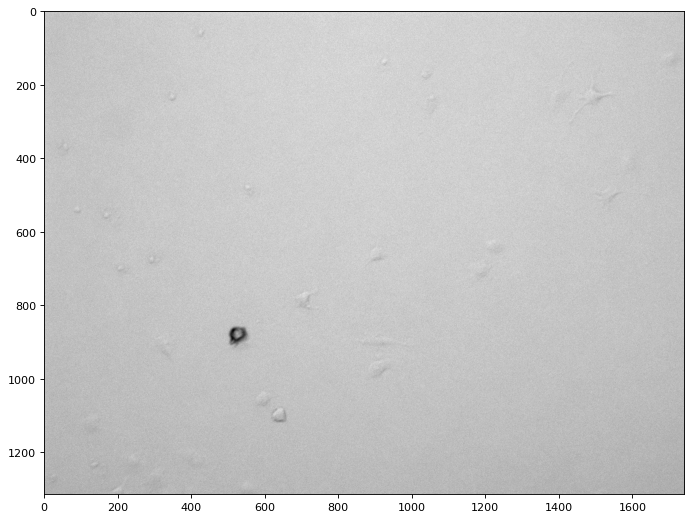

In [43]:
# Let's take a look at an individual image now.

image = cv2.imread('data/split/0001.png', cv2.IMREAD_GRAYSCALE)
plot(image)

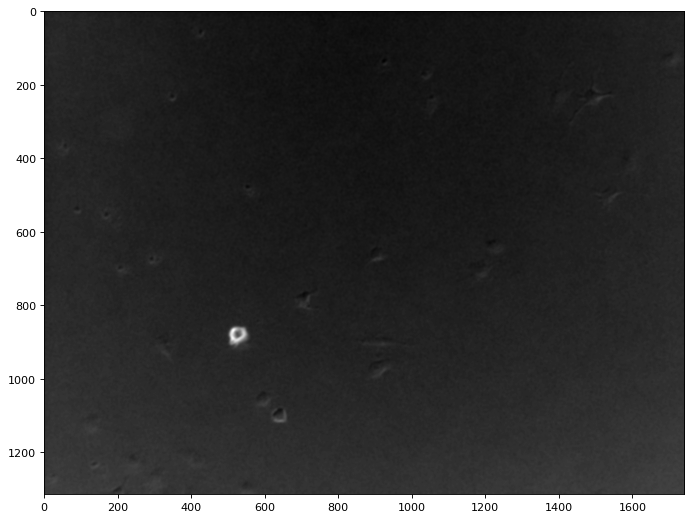

In [44]:
# We'll do the inversion and denoising step again

def process_image(image):
    inv_image = (-1 * image + 255).astype('uint8')
    denoised_image = cv2.bilateralFilter(inv_image, 9, 95, 95)
    return denoised_image
    
processed_image = process_image(image)
plot(processed_image)

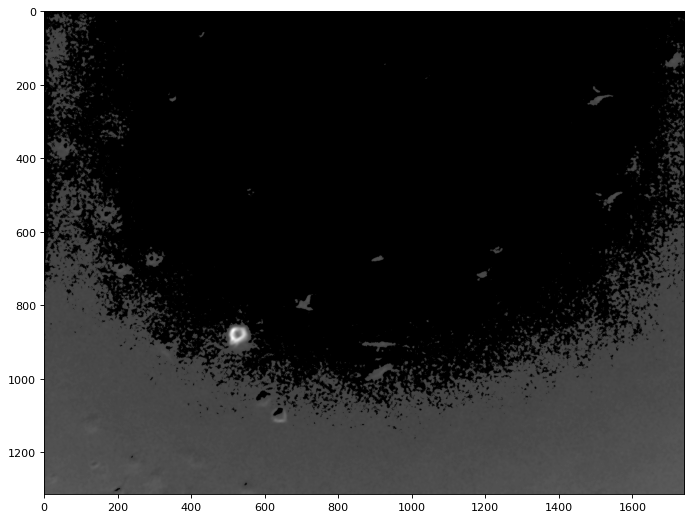

In [45]:
# Let's examine thresholding again

_, thresholded_image = cv2.threshold(processed_image, 60, 255, cv2.THRESH_TOZERO);
plot(thresholded_image)

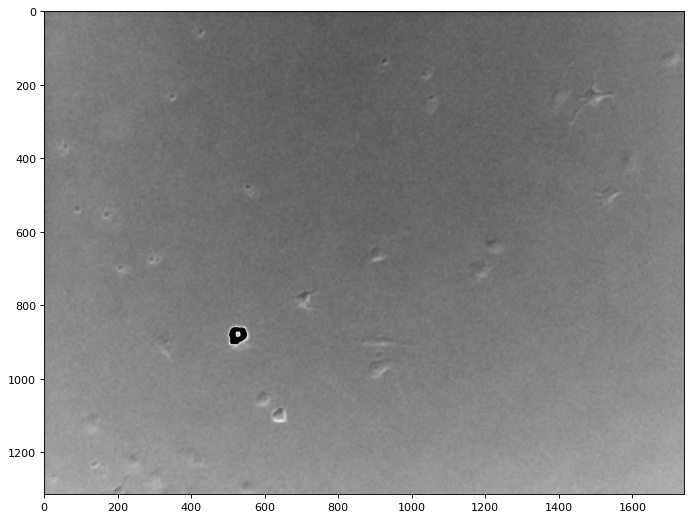

In [46]:
# Thresholding below still has the same issue. And from above...

_, thresholded_image = cv2.threshold(processed_image, 120, 255, cv2.THRESH_TOZERO_INV);
plot(thresholded_image)

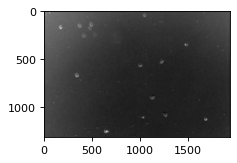

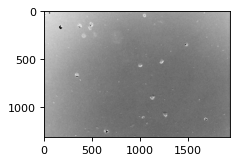

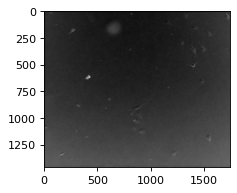

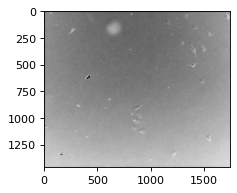

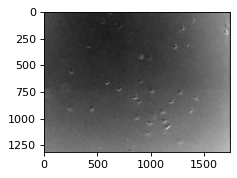

...

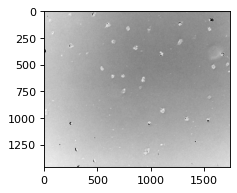

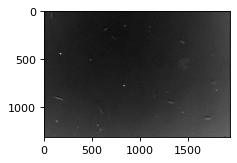

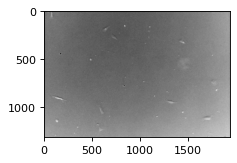

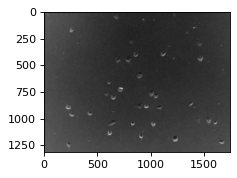

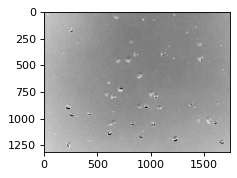

In [47]:
# We can actually go pretty far without removing from the actual cells.
# Let's see how this looks on the other images

def load_image(path):
    image = cv2.imread(path, cv2.IMREAD_GRAYSCALE)
    return process_image(image)

for i in range(25,150+1,25):
    path = 'data/split/'+'{:04d}'.format(i)+'.png'
    image = load_image(path)
    plot(image, res=(3,3))
    _, image = cv2.threshold(image, 120, 255, cv2.THRESH_TOZERO_INV);
    plot(image, res=(3,3))

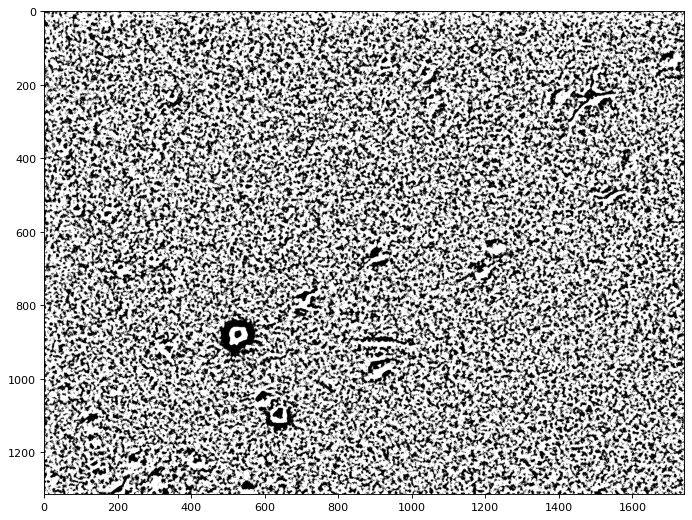

In [48]:
# Not so lucky. The images vary too much in brightness. Lastly, let's look at adaptive thresholding again
threshold_image = cv2.adaptiveThreshold(processed_image,1,cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY,61,1)
plot(threshold_image)

In [49]:
# It's not immediately helpful in making the shapes more recognizable. 
# I think we'll just stick with normalizing, and denoising.
imgs = [f for f in os.listdir('data/split') if f[-4:]=='.png']
global_index = 0
for img in tqdm(imgs, total=len(imgs), ncols=80):
    image = load_image('data/split/'+img)
    global_index += 1
    path = 'data/processed_split/' + "{:04d}".format(global_index) + '.png'
    save(path, image)

100%|███████████████████████████████████████| 1821/1821 [01:58<00:00, 15.38it/s]
